# Init

In [331]:
# dataset
FILENAME = "compounds_ms2structures"

# similarity calculation
MORGAN_RADIUS=9
FINGERPRINT_BITS=4096

# analogue selection
NUM_QUERIES = 1000
GROUP_SIZE=10
SIMILARITY_RANGE=(0.7, 0.9999)
NO_OVERLAP=False
RANDOM_SELECT = True   # Set to false to iterate through the dataset sequentially. Might be be better for high similarity selections.
SEED=42

In [332]:
import os
import sys
import ast
import pandas as pd
import numpy as np
import numba
from numba import prange
from tqdm.notebook import tqdm

from rdkit import DataStructs
from rdkit.Chem.Draw import SimilarityMaps
from rdkit.Chem import rdFingerprintGenerator, SmilesMolSupplier

from fingerprint_computation import FingerprintGenerator, compute_fingerprints_from_smiles
from ms_chemical_space_explorer.similarity_maps import generate_mol, get_similarity_map_weights, FingerprintFunction

MAIN_FOLDER = os.path.abspath(
    os.path.join(os.getcwd(), "../ms_chemical_space_explorer")
)

print(f"Adding to path: {MAIN_FOLDER}")
sys.path.append(MAIN_FOLDER)

Adding to path: g:\Dokumente\Studium\MMI\Master-Arbeit\Code\ms_chemical_space_explorer


In [333]:
cse_file    = os.path.join("data", "explorer_group_size",            f"explorer_benchmark_size{GROUP_SIZE}_morgan{MORGAN_RADIUS}_{FINGERPRINT_BITS}bits.csv")
hi_sim_file = os.path.join("data", "group_similarity", "benchmarks",     f"{FILENAME}_benchmark_num_queries{NUM_QUERIES}_random{int(RANDOM_SELECT)}_size{GROUP_SIZE}_range{SIMILARITY_RANGE}_no_overlap{int(NO_OVERLAP)}_seed{SEED}_morgan{MORGAN_RADIUS}_{FINGERPRINT_BITS}bits.csv")
lo_sim_file = os.path.join("data", "group_similarity", "benchmarks", f"{FILENAME}_dissimilarity_num_queries{NUM_QUERIES}_random{int(RANDOM_SELECT)}_size{GROUP_SIZE}_range{SIMILARITY_RANGE}_no_overlap{int(NO_OVERLAP)}_seed{SEED}_morgan{MORGAN_RADIUS}_{FINGERPRINT_BITS}bits.csv")

In [334]:
def get_df(df_string, group_size=GROUP_SIZE):
    if df_string == "cse":
        file = os.path.join("data", "explorer_group_size", f"explorer_benchmark_size{group_size}_morgan{MORGAN_RADIUS}_{FINGERPRINT_BITS}bits.csv")
        df = pd.read_csv(file, index_col=0)
        df.infer_objects()
        df.query_sims = df.query_sims.apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
        df.group_smiles = df.group_smiles.apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
    elif df_string == "hi_sim":
        file = os.path.join("data", "group_similarity", "benchmarks", f"{FILENAME}_benchmark_num_queries{NUM_QUERIES}_random{int(RANDOM_SELECT)}_size{group_size}_range{SIMILARITY_RANGE}_no_overlap{int(NO_OVERLAP)}_seed{SEED}_morgan{MORGAN_RADIUS}_{FINGERPRINT_BITS}bits.csv")
        df = pd.read_csv(file, index_col=0)
        df.infer_objects()
        df.analogue_ids = df.analogue_ids.apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
    elif df_string == "lo_sim":
        file = os.path.join("data", "group_similarity", "benchmarks", f"{FILENAME}_dissimilarity_num_queries{NUM_QUERIES}_random{int(RANDOM_SELECT)}_size{group_size}_range{SIMILARITY_RANGE}_no_overlap{int(NO_OVERLAP)}_seed{SEED}_morgan{MORGAN_RADIUS}_{FINGERPRINT_BITS}bits.csv")
        df = pd.read_csv(file, index_col=0)
        df.infer_objects()
        df.analogue_ids = df.analogue_ids.apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
        df.query_id_unsimilar = df.query_id_unsimilar.apply(lambda x: int(x) if isinstance(x, float) else x)
    else:
        raise ValueError("Unknown DataFrame provided.")
    
    #print(f"Loaded dataframe {df_string} from file: {file}")
    return df

In [335]:
cse = pd.read_csv(cse_file, index_col=0)
cse.infer_objects()
cse.query_sims = cse.query_sims.apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
cse.group_smiles = cse.group_smiles.apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
cse

,query_sim,query_mean_weights,group_sim,sgs,sgs_score,isf_score,distance,query_sims,sgs_scores,isf_scores,distances,query_smiles,group_smiles
0,0.482042,0.558742,0.340179,0.573357,0.873663,0.464615,0.052562,"[0.9484536082474226, 0.9509803921568627, 0.597...","[0.7919812396061213, 0.7674967281971505, 0.884...","[0.49783679371257056, 0.49783679371257056, 0.4...","[0.050013158584950146, 0.049141692437410955, 0...",CCCCCCCCCCCCCCCCCCCCCC(=O)N[C@@H](CO[C@H]1C([C...,[CCCCCCCCCCCCCCCCCCCC(=O)N[C@@H](CO[C@H]1C([C@...
1,0.256417,0.430357,0.171754,0.375537,0.713101,0.533611,0.164563,"[0.8344827586206897, 0.7952218430034129, 0.056...","[0.5698866134510231, 0.5956265995868589, 0.800...","[0.5706207329787752, 0.5706207329787752, 0.569...","[0.15275734984149203, 0.13455265127497307, 0.1...",CCCCCC(=O)O[C@@H]1[C@H](OC[C@H](O)[C@H](O)CO)O...,[CCCCCCCCCCCCCC(=O)O[C@@H]1[C@H](OC(=O)CCCCC)[...
2,0.186974,0.287829,0.094665,0.232405,0.918424,0.358662,0.239114,"[0.3183856502242152, 0.6666666666666666, 0.173...","[0.9189908263619687, 0.5085631010409168, 0.960...","[0.4530215089362769, 0.44444766580430367, 0.43...","[0.21729594522723794, 0.2074173104551046, 0.23...",O=C(C)O[C@@H]1[C@@H](O)[C@H](O)[C@@H](COC(=O)C...,[CC1=CC(C2=C(C(C)=C(O[C@H]3[C@H](OC(C)=O)[C@@H...
3,0.215687,0.311281,0.138883,0.253885,0.896323,0.332819,0.148705,"[0.45222929936305734, 0.4235294117647059, 0.31...","[0.7606499628040577, 0.8080465515209782, 0.869...","[0.4146367560411805, 0.40941776373259503, 0.39...","[0.0632840427404735, 0.14618027498479103, 0.17...",OC1CC2=C(O)C=C(O)C=C2OC1C1=CC(O)=C(O)C=C1,[OC[C@@H]1O[C@@H](Oc2cc(O)c3c(c2)O[C@H](c2ccc(...
4,0.090488,0.254861,0.094407,0.297997,0.825283,0.218916,0.217851,"[0.025423728813559324, 0.04201680672268908, 0....","[0.7590652289273833, 0.7942250613537059, 0.833...","[0.3901710495279119, 0.3842489379450639, 0.376...","[0.21260299007505123, 0.20264563948719583, 0.2...",C1=CC(=CC(=C1)OS(=O)(=O)O)O,"[C=C/C(C)=C/CC1C(=C)CCC2C(C)(C(=O)O)CCCC12C, C..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
598,0.094666,0.268399,0.109234,0.236751,0.844461,0.208721,0.209696,"[0.10606060606060606, 0.13059701492537312, 0.0...","[0.8675306956585733, 0.8511989481072275, 0.906...","[0.3247080609048947, 0.32096240842138857, 0.31...","[0.21092174493130977, 0.20040720450176297, 0.1...",COc1cc2nccc(Oc3cc(F)c(NC(=O)Nc4c(F)cc(F)cc4)cc...,[O=C1C=2C(O)=CC=CC2OC=3C1=C(OC)C=C4OC5C=COC5C4...
599,0.071463,0.259171,0.133068,0.291538,0.851911,0.296077,0.169293,"[0.08860759493670886, 0.07008086253369272, 0.0...","[0.7989459300358916, 0.8956261755364066, 0.858...","[0.4062001814618192, 0.39593904087955556, 0.39...","[0.1822620960105168, 0.1718855616345315, 0.168...",O=C1C=2C=CC=CC2C3N1C=4C=CC=CC4C(=O)N3CC(=O)N5C...,[O=C1C=C(OC2=CC(OC3OC(CO)C(O)C(O)C3O)=CC(O)=C1...
600,0.104063,0.245746,0.124837,0.241189,0.896551,0.336801,0.283107,"[0.09523809523809523, 0.109375, 0.101522842639...","[0.8369247014027069, 0.8337302848964019, 0.901...","[0.4415408302679574, 0.43784637498118195, 0.43...","[0.28498434596792976, 0.2889179551818438, 0.29...",OC1=CC=C(C=C1OC)CC(C)C(C)CC2=CC=C3OCOC3=C2,[OC1=C2C(OC3=C(C(C)=CC(O)=C3Cl)C2=O)=C(Cl)C(OC...
601,0.233268,0.437209,0.186613,0.398653,0.886840,0.267700,0.177901,"[0.2283464566929134, 0.22764227642276422, 0.36...","[0.8508501144568574, 0.8814432218873526, 0.760...","[0.4025160545100062, 0.4012036339043659, 0.398...","[0.21586266002735688, 0.19749047266823405, 0.0...",CN(C)CCOC(C1=CC=CC=C1)C2=CC=CC=C2,"[CN1CCN(CC1)C(C2=CC=CC=C2)C3=CC=C(C=C3)Cl, C1C..."


In [336]:
hi_sim = pd.read_csv(hi_sim_file, index_col=0)
hi_sim.infer_objects()
hi_sim.analogue_ids = hi_sim.analogue_ids.apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
hi_sim

,analogue_ids,query_sim,query_mean_weights,group_sim,sgs,sgs_score
query_id,,,,,,
35713,"[23492, 6612, 788, 12150, 18256, 29122, 23200,...",0.757227,0.745032,0.651649,0.718469,0.958369
6698,"[9297, 4956, 9558, 22927, 18407, 4192, 36935, ...",0.728808,0.699278,0.741461,0.711796,0.930022
23723,"[4900, 21338, 4110, 34356, 19498, 21458, 6469,...",0.776946,0.779438,0.714194,0.768828,0.958988
23219,"[34068, 30328, 15327, 4203, 31300, 4192, 27915...",0.764761,0.690729,0.679330,0.671523,0.952904
7161,"[5401, 6018, 34482, 8816, 6420, 14039, 9393, 1...",0.752489,0.736315,0.651582,0.704055,0.949291
...,...,...,...,...,...,...
9389,"[12, 25711, 1846, 33912, 21350, 16668, 13371, ...",0.856211,0.724871,0.793353,0.725266,0.981181
34088,"[27120, 20763, 11214, 6487, 7447, 16501, 20032...",0.793224,0.760490,0.726373,0.781378,0.950357
26225,"[8055, 29135, 24062, 37303, 4502, 27413, 7567,...",0.754275,0.721508,0.703045,0.700822,0.937447


In [337]:
lo_sim = pd.read_csv(lo_sim_file, index_col=0)
lo_sim.infer_objects()
lo_sim.analogue_ids = lo_sim.analogue_ids.apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)
lo_sim.query_id_unsimilar = lo_sim.query_id_unsimilar.apply(lambda x: int(x) if isinstance(x, float) else x)
lo_sim

,analogue_ids,query_sim,group_sim,sgs,sgs_score,query_id_unsimilar,query_sim_unsimilar,sgs_score_unsimilar,query_mean_weights,mqw_unsimilar,sqs_unsimilar
query_id,,,,,,,,,,,
35713,"[23200, 15235, 23492, 16509, 788, 36440, 6612,...",0.757227,0.651649,0.718469,0.958369,7296,0.048941,0.495740,0.745032,0.242695,0.495740
6698,"[4956, 18407, 36935, 14442, 34068, 12344, 9297...",0.728808,0.741461,0.711796,0.930022,1639,0.034004,0.529015,0.699278,0.240811,0.529015
23723,"[6469, 4900, 21458, 21338, 4110, 2985, 4580, 3...",0.776946,0.714194,0.768828,0.958988,18024,0.019481,0.433941,0.779438,0.202769,0.433941
23219,"[34068, 19889, 23098, 30328, 4192, 27915, 4203...",0.764761,0.679330,0.671523,0.952904,16049,0.046053,0.593117,0.690729,0.264640,0.593117
7161,"[6420, 34482, 15048, 9393, 8816, 6018, 14039, ...",0.752489,0.651582,0.704055,0.949291,14628,0.032426,0.504996,0.736315,0.224490,0.504996
...,...,...,...,...,...,...,...,...,...,...,...
9389,"[13371, 16668, 1846, 4964, 12, 26636, 25711, 3...",0.856211,0.793353,0.725266,0.981181,29804,0.012239,0.555282,0.724871,0.291354,0.555282
34088,"[16501, 19951, 7447, 20032, 33526, 11214, 2076...",0.793224,0.726373,0.781378,0.950357,24155,0.017810,0.413372,0.760490,0.312947,0.413372
26225,"[8055, 31010, 7549, 29135, 276, 7567, 27413, 3...",0.754275,0.703045,0.700822,0.937447,17181,0.028164,0.524335,0.721508,0.225157,0.524335


# Helper Functions

In [338]:
compounds_path = os.path.join( "data", "datasets", FILENAME + ".csv")
compounds = pd.read_csv(compounds_path)
mol_supplier = SmilesMolSupplier(compounds_path, delimiter=',', titleLine=True, smilesColumn=1, nameColumn=0)

In [339]:

from rdkit.Chem import MolFromSmiles

def get_analogue(df, q, a):
    """Get the rdkit Mol for analogue number 'a' from query with id 'q'"""
    if(df is cse):
        return MolFromSmiles(df.iloc[q].group_smiles[a])
    else:
        aid = hi_sim.iloc[q].analogue_ids[a]
        return mol_supplier[aid]

def get_query(df, q):
    """Get the rdkit Mol for query 'q'"""
    if(df is cse):
        return MolFromSmiles(df.iloc[q].query_smiles)
    elif(df is lo_sim):
        return mol_supplier[int(lo_sim.iloc[q].query_id_unsimilar)]
    else:
        return mol_supplier[int(hi_sim.iloc[q].name)]

def get_analogue_all(df, q):
    """Get the rdkit Mol for analogue number 'a' from query with id 'q'"""
    if(df is cse):
        return [MolFromSmiles(x) for x in df.iloc[q].group_smiles]
    else:
        return [mol_supplier[a] for a in hi_sim.iloc[q].analogue_ids]

In [340]:
def get_analogue_smiles(df, q, a):
    """Get the SMILES for analogue number 'a' from query with id 'q'"""
    if(df is cse):
        return df.iloc[q].group_smiles[a]
    else:
        aid = hi_sim.iloc[q].analogue_ids[a]
        return compounds.smiles[aid]

def get_query_smiles(df, q):
    """Get the SMILES for query 'q'"""
    if(df is cse):
        return df.iloc[q].query_smiles
    elif(df is lo_sim):
        return compounds.smiles[lo_sim.iloc[q].query_id_unsimilar]
    else:
        return compounds.smiles[hi_sim.iloc[q].name]

def get_analogue_smiles_all(df, q):
    """Get the SMILES for analogue number 'a' from query with id 'q'"""
    if(df is cse):
        return df.iloc[q].group_smiles
    else:
        aids = hi_sim.iloc[q].analogue_ids
        return compounds.smiles[aids].values.tolist()

In [341]:
from ms_chemical_space_explorer.similarity_maps import FingerprintFunction

fp_function = FingerprintFunction(fingerprint = "MORGAN")
fp_function.fp_type = "count"
fp_function.nbits = FINGERPRINT_BITS
fp_function.morgan_radius = MORGAN_RADIUS

In [342]:
fpgen = rdFingerprintGenerator.GetMorganGenerator(radius=MORGAN_RADIUS, fpSize=FINGERPRINT_BITS)

def get_sim(ref, probe):
    return DataStructs.TanimotoSimilarity(fpgen.GetCountFingerprint(ref), fpgen.GetCountFingerprint(probe))

def ruzicka_similarity(A, B):
    min_sum = np.sum(np.minimum(A, B))
    max_sum = np.sum(np.maximum(A, B))
    
    return min_sum / max_sum

In [343]:
sim_matrix_file = os.path.join("data", "group_similarity", f"{FILENAME}_ruzicka_similarities_morgan{MORGAN_RADIUS}_{FINGERPRINT_BITS}bits.npy")
sim_matrix = np.load(sim_matrix_file, mmap_mode ='r')

q=5
print([sim_matrix[lo_sim.iloc[q].query_id_unsimilar][aid] for aid in lo_sim.iloc[q].analogue_ids])
print([sim_matrix[hi_sim.iloc[q].name][aid] for aid in hi_sim.iloc[q].analogue_ids])

[0.05376344, 0.052489907, 0.05248619, 0.0509915, 0.0509915, 0.053793103, 0.051034484, 0.05394191, 0.055330634, 0.055181697]
[0.92788464, 0.7798595, 0.76523703, 0.7567568, 0.7488789, 0.72949004, 0.72103006, 0.7117117, 0.7094017, 0.70212764]


In [344]:
from io import BytesIO
from PIL import Image

def str_to_image(byte_data: str) -> Image.Image:
    bio = BytesIO(byte_data)
    return Image.open(bio)

In [345]:
def draw_images(imgs: list[Image.Image], buffer: int = 5, max_ratio: float = 9.1) -> Image.Image:
    result = imgs[0]
    for i, img in enumerate(imgs[1:], start=1):
        width = result.width + buffer + img.width
        height = max(result.height, img.height)
        if (width / height) <= max_ratio:
            # print(f"Add Horizontal at {i}. Ratio: {width/height}")
            result = stack_images(result, img, vertical=False)
        else:
            # print(f"Add Vertical at {i}. Ratio: {width/height}")
            result = stack_images(result, draw_images(imgs[i:], buffer=buffer, max_ratio=max_ratio), vertical=True)
            break
    return result


def stack_images(img1: Image.Image, img2: Image.Image, vertical: bool = True, buffer: int = 5) -> Image.Image:
    img1_xoffset = 0
    img1_yoffset = 0
    img2_xoffset = 0
    img2_yoffset = 0

    # Calculate dimensions + offsets
    if vertical:
        if img1.width > img2.width:
            total_width = img1.width
            #img2_xoffset = (img1.width - img2.width) // 2
        else:
            total_width = img2.width
            #img1_xoffset = (img2.width - img1.width) // 2

        total_height = img1.height + buffer + img2.height
    else:
        if img1.height > img2.height:
            total_height = img1.height
            img2_yoffset = (img1.height - img2.height) // 2
        else:
            total_height = img2.height
            img1_yoffset = (img2.height - img1.height) // 2
        total_width = img1.width + buffer + img2.width

    # Create new image
    combined = Image.new("RGBA", (total_width, total_height))

    # Paste images
    combined.paste(img1, (img1_xoffset, img1_yoffset))
    if vertical:
        combined.paste(img2, (img2_xoffset, img1.height + buffer))
    else:
        combined.paste(img2, (img1.width + buffer, img2_yoffset))

    return combined

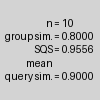

In [346]:
from PIL import ImageDraw

def descriptive_entry(mol_img_size, n, group_sim, query_sim, sqs, x_offset=20, y_offset=6, bg_color="lightgrey"):
    desc_img = Image.new("RGBA", (mol_img_size, mol_img_size), color=bg_color)
    draw = ImageDraw.Draw(desc_img)
    x_offset = mol_img_size / x_offset
    y_offset = mol_img_size / y_offset
    
    draw.text(xy=[x_offset,y_offset],
            text=f"n\ngroup sim.\nSQS\nmean\nquery sim.",
            font_size=mol_img_size / 10,
            align="right",
            spacing=mol_img_size/30,
            fill="black",
            )
    draw.text(xy=[x_offset + mol_img_size/10 * 4.7, y_offset],
            text=f" = {n}\n = {group_sim:.4f}\n = {sqs:.4f}\n\n = {query_sim:.4f}",
            font_size=mol_img_size / 10,
            align="left",
            fill="black",
            spacing=mol_img_size/30,
            )
    return desc_img

descriptive_entry(100, 10, 0.8, 0.9, 0.955555555555555)

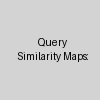

In [347]:
def bottom_left_entry(mol_img_size, x_offset=6, y_offset=2.75, bg_color="lightgrey"):
        x_offset = mol_img_size / x_offset
        y_offset = mol_img_size / y_offset

        bottom_left_img = Image.new("RGBA", (mol_img_size, mol_img_size), color=bg_color)
        draw = ImageDraw.Draw(bottom_left_img)
        font_size = mol_img_size / 10
        draw.text(xy=[x_offset, y_offset],
                text=f"Query\nSimilarity Maps:",
                align="center",
                font_size=font_size,
                fill="black")

        # draw.text(xy=[x_offset, y_offset],
        #         text=f"\n\nmean\nquery sim.",
        #         font_size=mol_img_size / 10,
        #         align="right",
        #         spacing=mol_img_size/30,
        #         fill="black",
        #         )
        # draw.text(xy=[x_offset + mol_img_size/10 * 4.7, y_offset],
        #         text=f"\n\n\n = {5:.4f}",
        #         font_size=mol_img_size / 10,
        #         align="left",
        #         fill="black",
        #         spacing=mol_img_size/30,
        #         )

        return bottom_left_img

bottom_left_entry(100)

In [348]:
7/2

3.5

In [349]:
import math
import statistics
from rdkit.Chem import Draw
from ms_chemical_space_explorer.chemical_space_visualizer import (
    draw_sim_map,
    #draw_images,
    #stack_images,
    SimMapLegend
)
from ms_chemical_space_explorer.similarity_maps import get_similarity_map_weights, get_group_similarity_map_weights, get_similarity_map_byte_source

def generate_similarity_visualization(query_id, df, mol_img_size=400, overwrite_existing=False, log=False):
    if df is cse:
        dataset_name = "cse"
        actual_id = query_id
    elif df is hi_sim:
        dataset_name = "hi_sim"
        actual_id = hi_sim.iloc[query_id].name
    elif df is lo_sim:
        dataset_name = "lo_sim"
        actual_id = lo_sim.iloc[query_id].query_id_unsimilar
    else:
        dataset_name = "unknown"
        actual_id = query_id
    
    file = f"simmap_sample_{dataset_name}_{actual_id}.png"
    file_path = os.path.join("imgs", "simmap_samples", file)
    
    if not overwrite_existing and os.path.exists(file_path):
        if log:
            print(f"File {file_path} already exists. Skipping generation.")
        return Image.open(file_path)
    
    if log:
        print(f"Computing Similarities...")
    query = get_query(df, query_id)
    amols = get_analogue_all(df, query_id)
    
    if df is cse:
        query_fp = fpgen.GetCountFingerprint(query)
        analogue_fps = [fpgen.GetCountFingerprint(mol) for mol in amols]
        similarities = [DataStructs.TanimotoSimilarity(query_fp, fp) for fp in analogue_fps]
        sims = df.iloc[query_id].query_sims
        print(f"DF sims  = {sims}")
        print(f"New Sims = {similarities}")
        query_desc = f"{query_id}"
        benchmark_desc = "ChemSpaceExplorer Benchmark"
    elif df is hi_sim:
        similarities = [sim_matrix[actual_id][aid] for aid in hi_sim.iloc[query_id].analogue_ids]
        query_desc = f"{actual_id}"
        benchmark_desc = "Stacked Similarity Map Benchmark"
    else:  # lo_sim
        similarities = [sim_matrix[actual_id][aid] for aid in hi_sim.iloc[query_id].analogue_ids]
        query_desc = f"{actual_id}"
        benchmark_desc = "Dissimilarity Benchmark"

    if log:
        print(f"Generating SimMaps...")
    size = [mol_img_size, mol_img_size]
    query_sim_maps = [bottom_left_entry(mol_img_size)]
    group_sim_maps = {}

    for i in range(len(amols) + 1):
        if i < len(amols):
            draw2d = Draw.MolDraw2DCairo(mol_img_size, mol_img_size)
            legend = SimMapLegend(f"query sim. = {similarities[i]:.4}", size=mol_img_size/10, position=[mol_img_size/15, mol_img_size - mol_img_size/7.5])
            query_sim_maps.append(draw_sim_map(draw2d, query, amols[i], fp_function=fp_function.get_function, legend=legend))
        
        if i < 2:
            continue
                
        if df is lo_sim:
            group_df = get_df("lo_sim", group_size=i)
            query_sim = group_df.iloc[query_id].query_sim_unsimilar
            sqs = group_df.iloc[query_id].sgs_score_unsimilar
        else:
            if df is cse:
                group_df = get_df("cse", group_size=i)
            else:
                group_df = get_df("hi_sim", group_size=i)

            query_sim = statistics.mean(similarities[:i])#df.iloc[query_id].query_sim
            sqs = group_df.iloc[query_id].sgs_score
        group_sim = group_df.iloc[query_id].group_sim
        
        group_sim_maps[i] = [descriptive_entry(mol_img_size, i, group_sim, query_sim, sqs)]
        
        weigths = get_group_similarity_map_weights(amols[:i], fp_function=fp_function)
        for j, w in enumerate(weigths):
            bytes = get_similarity_map_byte_source(amols[j], w, size=size)
            img = str_to_image(bytes)
            group_sim_maps[i].append(img)

    if log:
        print(f"Composing final image...")
    group_sim_maps_all = []
    for i, imgs in group_sim_maps.items():
        group_sim_maps_all.append(draw_images(imgs, max_ratio=12))

    query_sim_maps_img =  draw_images(query_sim_maps, max_ratio=12)
    group_maps_img =  draw_images(group_sim_maps_all, max_ratio=3)
    final_img = stack_images(group_maps_img, query_sim_maps_img)

    # query image
    query_img_ratio = math.ceil(len(amols) / 2) - 1
    query_img_size = query_img_ratio * mol_img_size + 5 * (query_img_ratio - 1)
    
    draw2d = Draw.MolDraw2DCairo(query_img_size, query_img_size)
    draw2d.DrawMolecule(query)
    draw2d.FinishDrawing()
    query_img = str_to_image(draw2d.GetDrawingText())

    draw = ImageDraw.Draw(query_img)
    font_size = query_img_ratio * mol_img_size / 10
    draw.text(xy=[font_size * 0.5, -font_size * 0.5],
        text=f"Stacked Similaritu Mao Benchmark Oueru\n{benchmark_desc} Query",
        align="right",
        font_size=font_size / 2,
        fill="black")
    draw.text(xy=[query_img.width - font_size * 2, font_size * 0.5],
            text=f"{actual_id}",
            align="right",
            font_size=font_size,
            fill="black")

    # paste query image
    x_offset = final_img.width - query_img.width
    final_img.paste(query_img, (x_offset, 0))# mol_img_size + 5))
    
    if log:
        print(f"Saving image to {file_path}...")
    final_img.save(file_path, format='PNG', quality=95)
    return final_img

# Vis

## basic plotting

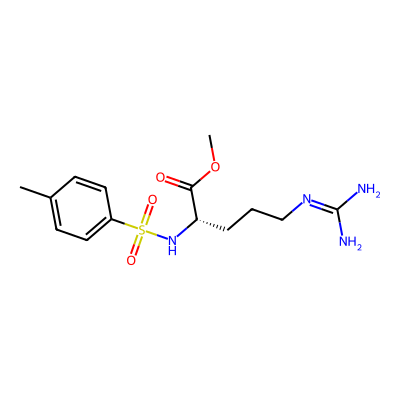

In [350]:
from rdkit.Chem import Draw
from ms_chemical_space_explorer.chemical_space_visualizer import (
    #draw_images,
    draw_mol,
)

draw2d = Draw.MolDraw2DCairo(400, 400)
draw_mol(draw2d, get_query(cse, q))

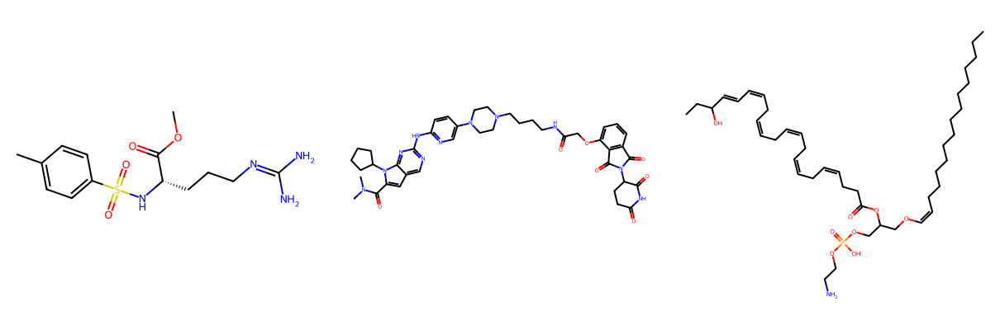

In [351]:
draw_images([draw_mol(Draw.MolDraw2DCairo(400, 400), get_query(df, q)) for df in [cse, lo_sim, hi_sim]],)

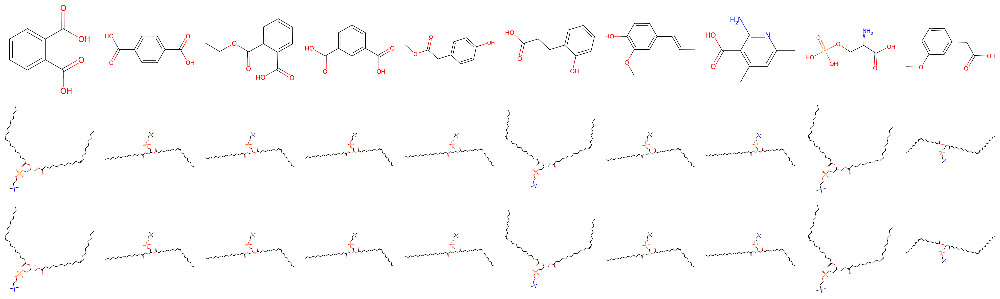

In [352]:
analogues_all = [get_analogue_all(df, 15) for df in [cse, lo_sim, hi_sim]]
draw_images([draw_images([draw_mol(Draw.MolDraw2DCairo(400, 400), a) for a in analogues], max_ratio=11) for analogues in analogues_all])

## sim maps

good example: cse: qid=140

DF sims  = [0.5663716814159292, 0.4235294117647059, 0.44654088050314467, 0.4426229508196721, 0.45222929936305734, 0.45222929936305734, 0.5545454545454546, 0.3037037037037037, 0.23076923076923078, 0.15789473684210525]
New Sims = [0.5663716814159292, 0.4235294117647059, 0.44654088050314467, 0.4426229508196721, 0.45222929936305734, 0.45222929936305734, 0.5545454545454546, 0.3037037037037037, 0.23076923076923078, 0.15789473684210525]


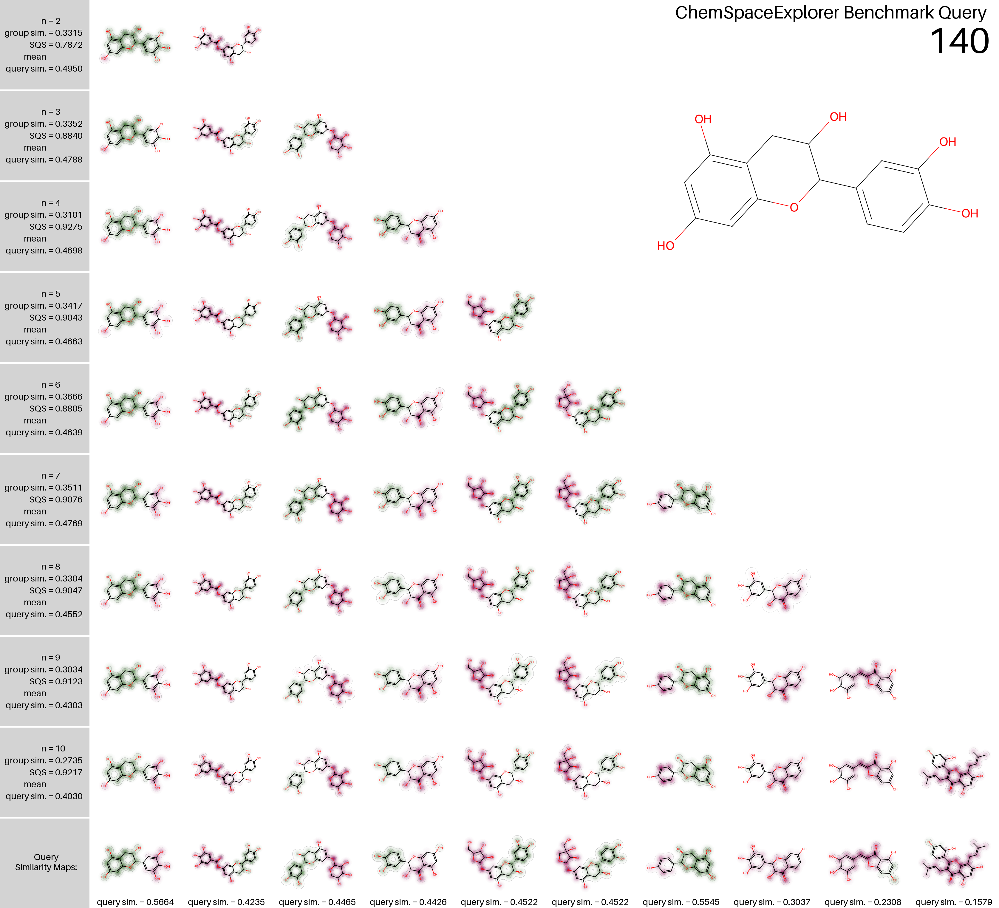

In [353]:
query_id = 140
df = cse
mol_img_size = 300

simmap_sample_img = generate_similarity_visualization(query_id, df, mol_img_size=mol_img_size, overwrite_existing=True)
simmap_sample_img

# Find Samples

## Find duplicate IDs

In [354]:
import pandas

columns=["max_group_sim", "median_group_sim", "min_group_sim", "max_sqs", "median_sqs", "min_sqs", "max_query_sim", "median_query_sim", "min_query_sim"]
cse_sample_df = pandas.DataFrame(columns=columns)
lo_sim_sample_df = pandas.DataFrame(columns=columns)
hi_sim_sample_df = pandas.DataFrame(columns=columns)

for group_size in range(GROUP_SIZE - 1):
    group_size += 2
    cse = get_df("cse", group_size=group_size)
    hi_sim = get_df("hi_sim", group_size=group_size)
    lo_sim = get_df("lo_sim", group_size=group_size)
    
    cse_sample_df.loc[group_size] = [
        cse.group_sim.idxmax(),
        cse.group_sim.sort_values().index[len(cse.group_sim)//2],
        cse.group_sim.idxmin(),
        cse.sgs_score.idxmax(),
        cse.sgs_score.sort_values().index[len(cse.sgs_score)//2],
        cse.sgs_score.idxmin(),
        cse.query_sim.idxmax(),
        cse.query_sim.sort_values().index[len(cse.query_sim)//2],
        cse.query_sim.idxmin()
        ]
    lo_sim_sample_df.loc[group_size] = [
        lo_sim.index.get_loc(lo_sim.group_sim.idxmax()),
        lo_sim.index.get_loc(lo_sim.group_sim.sort_values().index[len(lo_sim.group_sim)//2]),
        lo_sim.index.get_loc(lo_sim.group_sim.idxmin()),
        lo_sim.index.get_loc(lo_sim.sgs_score_unsimilar.idxmax()),
        lo_sim.index.get_loc(lo_sim.sgs_score_unsimilar.sort_values().index[len(lo_sim.sgs_score_unsimilar)//2]),
        lo_sim.index.get_loc(lo_sim.sgs_score_unsimilar.idxmin()),
        lo_sim.index.get_loc(lo_sim.query_sim_unsimilar.idxmax()),
        lo_sim.index.get_loc(lo_sim.query_sim_unsimilar.sort_values().index[len(lo_sim.query_sim_unsimilar)//2]),
        lo_sim.index.get_loc(lo_sim.query_sim_unsimilar.idxmin())
    ]
    hi_sim_sample_df.loc[group_size] = [
        hi_sim.index.get_loc(hi_sim.group_sim.idxmax()),
        hi_sim.index.get_loc(hi_sim.group_sim.sort_values().index[len(hi_sim.group_sim)//2]),
        hi_sim.index.get_loc(hi_sim.group_sim.idxmin()),
        hi_sim.index.get_loc(hi_sim.sgs_score.idxmax()),
        hi_sim.index.get_loc(hi_sim.sgs_score.sort_values().index[len(hi_sim.sgs_score)//2]),
        hi_sim.index.get_loc(hi_sim.sgs_score.idxmin()),
        hi_sim.index.get_loc(hi_sim.query_sim.idxmax()),
        hi_sim.index.get_loc(hi_sim.query_sim.sort_values().index[len(hi_sim.query_sim)//2]),
        hi_sim.index.get_loc(hi_sim.query_sim.idxmin())
    ]

cse_sample_df

,max_group_sim,median_group_sim,min_group_sim,max_sqs,median_sqs,min_sqs,max_query_sim,median_query_sim,min_query_sim
2,251,283,582,62,198,442,0,53,445
3,210,394,582,41,48,491,0,13,445
4,210,130,582,41,242,491,0,498,445
5,0,288,582,557,563,491,0,193,445
6,557,261,582,557,221,491,145,150,370
7,443,234,582,557,341,491,443,385,370
8,443,589,582,557,29,491,145,407,370
9,443,52,582,557,321,491,145,562,370
10,145,100,582,557,441,491,145,213,370


In [355]:
def create_id_summary(df, df_name):
    """Create a summary of which IDs appear in which columns"""
    print(f"\n=== ID Summary for {df_name} ===")
    id_locations = {}
    
    for row in df.index:
        for col in df.columns:
            id_val = df.loc[row, col]
            if id_val not in id_locations:
                id_locations[id_val] = []
            id_locations[id_val].append(f"{row}_{col}")
    
    # Show only IDs that appear multiple times
    multi_occurrence_ids = {k: v for k, v in id_locations.items() if len(v) > 1}
    
    for id_val, locations in multi_occurrence_ids.items():
        print(f"ID {id_val}: {locations}")
    
    return multi_occurrence_ids

# Check CSE dataframe
print("Checking cse_sample_df for duplicates:")
cse_summary = create_id_summary(cse_sample_df, "cse_sample_df")
cse_ids = list(cse_summary.keys())
cse_ids

Checking cse_sample_df for duplicates:

=== ID Summary for cse_sample_df ===
ID 582: ['2_min_group_sim', '3_min_group_sim', '4_min_group_sim', '5_min_group_sim', '6_min_group_sim', '7_min_group_sim', '8_min_group_sim', '9_min_group_sim', '10_min_group_sim']
ID 0: ['2_max_query_sim', '3_max_query_sim', '4_max_query_sim', '5_max_group_sim', '5_max_query_sim']
ID 445: ['2_min_query_sim', '3_min_query_sim', '4_min_query_sim', '5_min_query_sim']
ID 210: ['3_max_group_sim', '4_max_group_sim']
ID 41: ['3_max_sqs', '4_max_sqs']
ID 491: ['3_min_sqs', '4_min_sqs', '5_min_sqs', '6_min_sqs', '7_min_sqs', '8_min_sqs', '9_min_sqs', '10_min_sqs']
ID 557: ['5_max_sqs', '6_max_group_sim', '6_max_sqs', '7_max_sqs', '8_max_sqs', '9_max_sqs', '10_max_sqs']
ID 145: ['6_max_query_sim', '8_max_query_sim', '9_max_query_sim', '10_max_group_sim', '10_max_query_sim']
ID 370: ['6_min_query_sim', '7_min_query_sim', '8_min_query_sim', '9_min_query_sim', '10_min_query_sim']
ID 443: ['7_max_group_sim', '7_max_query_s

[582, 0, 445, 210, 41, 491, 557, 145, 370, 443]

In [356]:
hi_sim_sample_df

,max_group_sim,median_group_sim,min_group_sim,max_sqs,median_sqs,min_sqs,max_query_sim,median_query_sim,min_query_sim
2,537,321,77,954,710,865,864,910,724
3,641,824,77,695,417,212,396,86,724
4,641,312,77,695,636,212,142,525,724
5,641,492,718,695,327,414,142,13,724
6,641,581,298,462,818,617,728,367,724
7,641,996,64,462,703,414,432,353,724
8,187,952,64,53,867,414,432,660,724
9,187,392,64,116,284,414,432,811,724
10,187,895,64,462,784,414,432,54,724


In [357]:
hi_sim_summary = create_id_summary(hi_sim_sample_df, "hi_sim_sample_df")
hi_sim_ids = list(hi_sim_summary.keys())
hi_sim_ids


=== ID Summary for hi_sim_sample_df ===
ID 77: ['2_min_group_sim', '3_min_group_sim', '4_min_group_sim']
ID 724: ['2_min_query_sim', '3_min_query_sim', '4_min_query_sim', '5_min_query_sim', '6_min_query_sim', '7_min_query_sim', '8_min_query_sim', '9_min_query_sim', '10_min_query_sim']
ID 641: ['3_max_group_sim', '4_max_group_sim', '5_max_group_sim', '6_max_group_sim', '7_max_group_sim']
ID 695: ['3_max_sqs', '4_max_sqs', '5_max_sqs']
ID 212: ['3_min_sqs', '4_min_sqs']
ID 142: ['4_max_query_sim', '5_max_query_sim']
ID 414: ['5_min_sqs', '7_min_sqs', '8_min_sqs', '9_min_sqs', '10_min_sqs']
ID 462: ['6_max_sqs', '7_max_sqs', '10_max_sqs']
ID 64: ['7_min_group_sim', '8_min_group_sim', '9_min_group_sim', '10_min_group_sim']
ID 432: ['7_max_query_sim', '8_max_query_sim', '9_max_query_sim', '10_max_query_sim']
ID 187: ['8_max_group_sim', '9_max_group_sim', '10_max_group_sim']


[77, 724, 641, 695, 212, 142, 414, 462, 64, 432, 187]

In [358]:
lo_sim_sample_df

,max_group_sim,median_group_sim,min_group_sim,max_sqs,median_sqs,min_sqs,max_query_sim,median_query_sim,min_query_sim
2,187,895,64,194,217,929,156,448,141
3,187,895,64,194,217,929,156,599,300
4,187,895,64,194,217,929,156,997,300
5,187,895,64,194,217,929,156,515,300
6,187,895,64,194,217,929,156,599,300
7,187,895,64,194,217,929,156,906,300
8,187,895,64,194,217,929,495,642,300
9,187,895,64,194,217,929,495,448,300
10,187,895,64,194,217,929,495,448,300


In [359]:
lo_sim_summary = create_id_summary(lo_sim_sample_df, "lo_sim_sample_df")
lo_sim_ids = list(lo_sim_summary.keys())
lo_sim_ids


=== ID Summary for lo_sim_sample_df ===
ID 187: ['2_max_group_sim', '3_max_group_sim', '4_max_group_sim', '5_max_group_sim', '6_max_group_sim', '7_max_group_sim', '8_max_group_sim', '9_max_group_sim', '10_max_group_sim']
ID 895: ['2_median_group_sim', '3_median_group_sim', '4_median_group_sim', '5_median_group_sim', '6_median_group_sim', '7_median_group_sim', '8_median_group_sim', '9_median_group_sim', '10_median_group_sim']
ID 64: ['2_min_group_sim', '3_min_group_sim', '4_min_group_sim', '5_min_group_sim', '6_min_group_sim', '7_min_group_sim', '8_min_group_sim', '9_min_group_sim', '10_min_group_sim']
ID 194: ['2_max_sqs', '3_max_sqs', '4_max_sqs', '5_max_sqs', '6_max_sqs', '7_max_sqs', '8_max_sqs', '9_max_sqs', '10_max_sqs']
ID 217: ['2_median_sqs', '3_median_sqs', '4_median_sqs', '5_median_sqs', '6_median_sqs', '7_median_sqs', '8_median_sqs', '9_median_sqs', '10_median_sqs']
ID 929: ['2_min_sqs', '3_min_sqs', '4_min_sqs', '5_min_sqs', '6_min_sqs', '7_min_sqs', '8_min_sqs', '9_min_sq

[187, 895, 64, 194, 217, 929, 156, 448, 599, 300, 495]

## Plot duplicate IDS

In [360]:
for id in cse_ids:
    img = generate_similarity_visualization(id, cse, mol_img_size=mol_img_size)
    img.show()

In [361]:
for id in hi_sim_ids:
    img = generate_similarity_visualization(id, hi_sim, mol_img_size=mol_img_size)
    img.show()

# ChemSpace Plots

## find good cases

In [362]:
# hi QS and high GS
cse4df = get_df("cse", group_size=4)
mask = (cse4df["group_sim"] > 0.6) & (cse4df["query_sim"] > 0.6)

cse4df[mask]

,query_sim,query_mean_weights,group_sim,sgs,sgs_score,isf_score,distance,query_sims,sgs_scores,isf_scores,distances,query_smiles,group_smiles
0,0.744033,0.715470,0.623532,0.714492,0.883870,0.489066,0.049305,"[0.9509803921568627, 0.9484536082474226, 0.478...","[0.8771261622884061, 0.866423148617466, 0.9206...","[0.49783679371257056, 0.49783679371257056, 0.4...","[0.049141692437410955, 0.050013158584950146, 0...",CCCCCCCCCCCCCCCCCCCCCC(=O)N[C@@H](CO[C@H]1C([C...,[CCCCCCCCCCCCCCCCCCCCCCCC(=O)N[C@@H](CO[C@H]1C...
145,0.653354,0.655255,0.641353,0.694451,0.873389,0.655374,0.027140,"[0.582089552238806, 0.5393939393939394, 0.6075...","[0.8746886597446006, 0.925494749982898, 0.8752...","[0.6583708655062653, 0.6583708655062653, 0.658...","[0.02751510772576049, 0.031503078574004806, 0....",C(CCCCCC)=CCC=CCC=CCC=CCCC(OC(COC(=O)CCCCCCCCC...,[C(CCCCCC)=CCC=CCC=CCC=CCCC(OC(COC(CCC=CCCCCCC...
210,0.652017,0.682478,0.718180,0.725657,0.910980,0.951826,0.044960,"[0.6415929203539823, 0.5894308943089431, 0.671...","[0.8928155260882835, 0.9023466385720037, 0.903...","[0.9524936569019901, 0.9524936569019901, 0.952...","[0.05732938930069276, 0.0552354349433658, 0.02...",C(CC=CCC=CCCC(=O)OCC(OC(CCC=CCC=CCCCCCCCCCC)=O...,[C(CC(=O)OCC(OC(CCC=CCC=CCCCCCCCCCC)=O)COP(O)(...
557,0.625340,0.690002,0.609385,0.713841,0.960603,0.536892,0.109877,"[0.6875, 0.616822429906542, 0.66, 0.5370370370...","[0.9414884819154535, 0.9394372999753547, 0.963...","[0.5612271744486886, 0.5349240395276237, 0.531...","[0.08488196032350703, 0.12137665790999075, 0.1...",C#CC[P+](C1=CC=CC=C1)(C2=CC=CC=C2)C3=CC=CC=C3,"[CC[P+](C1=CC=CC=C1)(C2=CC=CC=C2)C3=CC=CC=C3, ..."
574,0.601049,0.763265,0.615866,0.777832,0.947742,0.667395,0.080698,"[0.7183098591549296, 0.569620253164557, 0.55, ...","[0.9373818999788023, 0.9517592363920739, 0.958...","[0.675061395763632, 0.6695919560978738, 0.6681...","[0.13952369410148624, 0.07297268884847796, 0.0...",CN1C2=C(N(CCO)C=N2)C(=O)N(C)C1=O,"[CCCn1cnc2c1c(=O)n(c(=O)n2C)C, CC(O)Cn1cnc2c1c..."


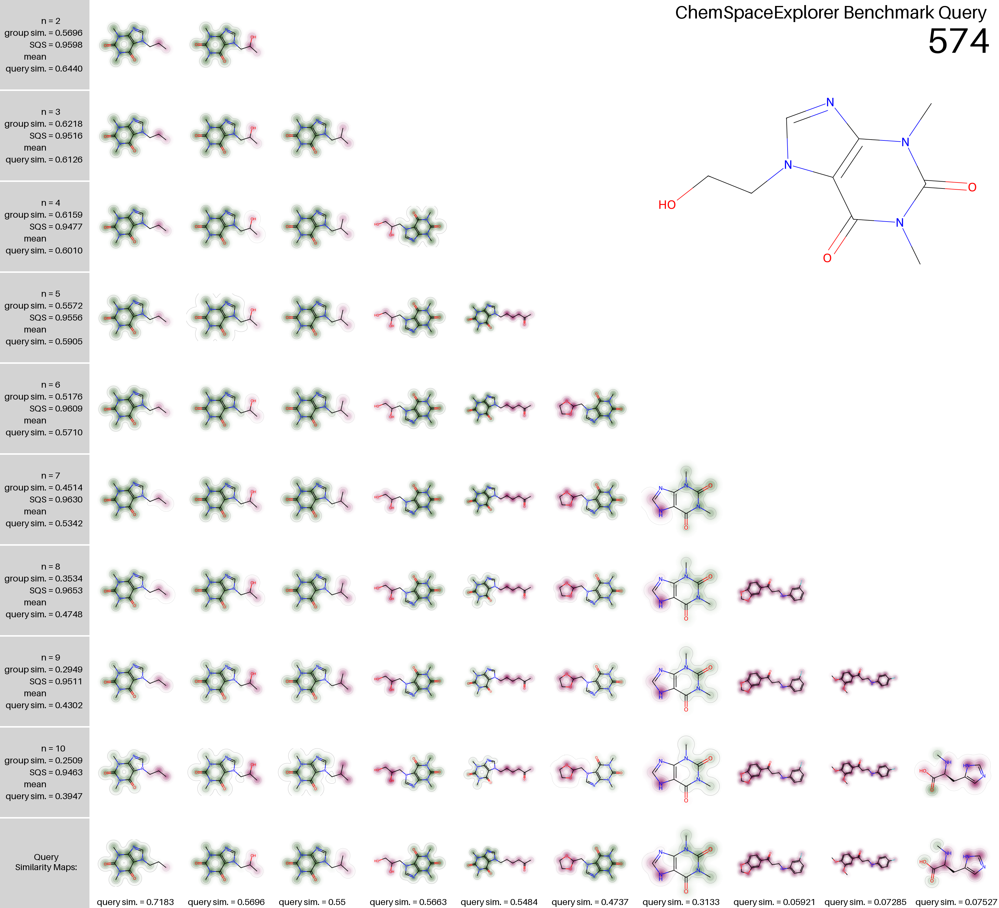

In [363]:
generate_similarity_visualization(574, cse, mol_img_size=mol_img_size)

In [364]:
# hi GS but low QS
cse4df = get_df("cse", group_size=4)
mask = (cse4df["group_sim"] > 0.6) & (cse4df["query_sim"] < 0.5)

cse4df[mask]

,query_sim,query_mean_weights,group_sim,sgs,sgs_score,isf_score,distance,query_sims,sgs_scores,isf_scores,distances,query_smiles,group_smiles
123,0.050581,0.262501,0.613915,0.719850,0.525335,0.578028,0.189329,"[0.05, 0.047619047619047616, 0.051194539249146...","[0.509436378891897, 0.5645595683646503, 0.5209...","[0.5824280799790243, 0.5786126139122083, 0.576...","[0.20032023510960217, 0.18054487881752235, 0.1...",CCCCCCC(O)CCCCCC/C=C/[C@H](O)[C@@H](OC(C)=O)[C...,[O=C(Cc1csc(-c2ccc(Cl)cc2)n1)N[C@@H](Cc1c[nH]c...
263,0.419922,0.586808,0.627054,0.748498,0.778428,0.940508,0.038858,"[0.435361216730038, 0.36363636363636365, 0.5, ...","[0.8033592933694342, 0.7693788137607445, 0.758...","[0.9438500790549755, 0.9438500790549755, 0.943...","[0.04008081755996917, 0.032561273111656464, 0....",CCCCCCCC\C=C/CCCCCCCC(=O)OCC(COP(O)(=O)OCC(N)C...,[[H][C@@](COC(=O)CCCCCCCCCCCCCCCCC)(COP(O)(=O)...
336,0.054968,0.276464,0.694247,0.699421,0.574145,0.951248,0.027403,"[0.056626506024096385, 0.060075093867334166, 0...","[0.5525052872263969, 0.523338857634184, 0.5941...","[0.9512476120746465, 0.9512476120746465, 0.951...","[0.02597943046315221, 0.026600495073691333, 0....",CC1=C(C(=O)C(=C(C1=O)OC)OC)C/C=C(\C)/CC/C=C(\C...,[CCCCCCCCCCCCCCC(=O)OC[C@@H](COC(=O)CCCCCCC/C=...
425,0.368286,0.567187,0.642911,0.741096,0.809814,0.637305,0.103703,"[0.38064516129032255, 0.37267080745341613, 0.3...","[0.8223061494702366, 0.79049548046575, 0.80558...","[0.6637238137944051, 0.6336902254743213, 0.628...","[0.10821430318013214, 0.10056175810844603, 0.1...",O=C(CSc1nc(O)c2ccccc2n1)Nc1ccc(F)cc1,"[OC(CSc1nc(O)c2ccccc2n1)=Nc1cccc(Cl)c1, OC(CSc..."
491,0.022052,0.153074,0.624508,0.744447,0.379911,0.721575,0.164023,"[0.023809523809523808, 0.019138755980861243, 0...","[0.3205484563641975, 0.477351523648221, 0.3079...","[0.7239154685729983, 0.7239154685729983, 0.723...","[0.166137116839702, 0.16270235550059386, 0.159...",C=C1CCC=C(C)CCC2C1CC2(C)C,"[CCCCCCCC(NCCC1=CNC2=C1C=CC=C2)=O, CCCCCCCCCCC..."


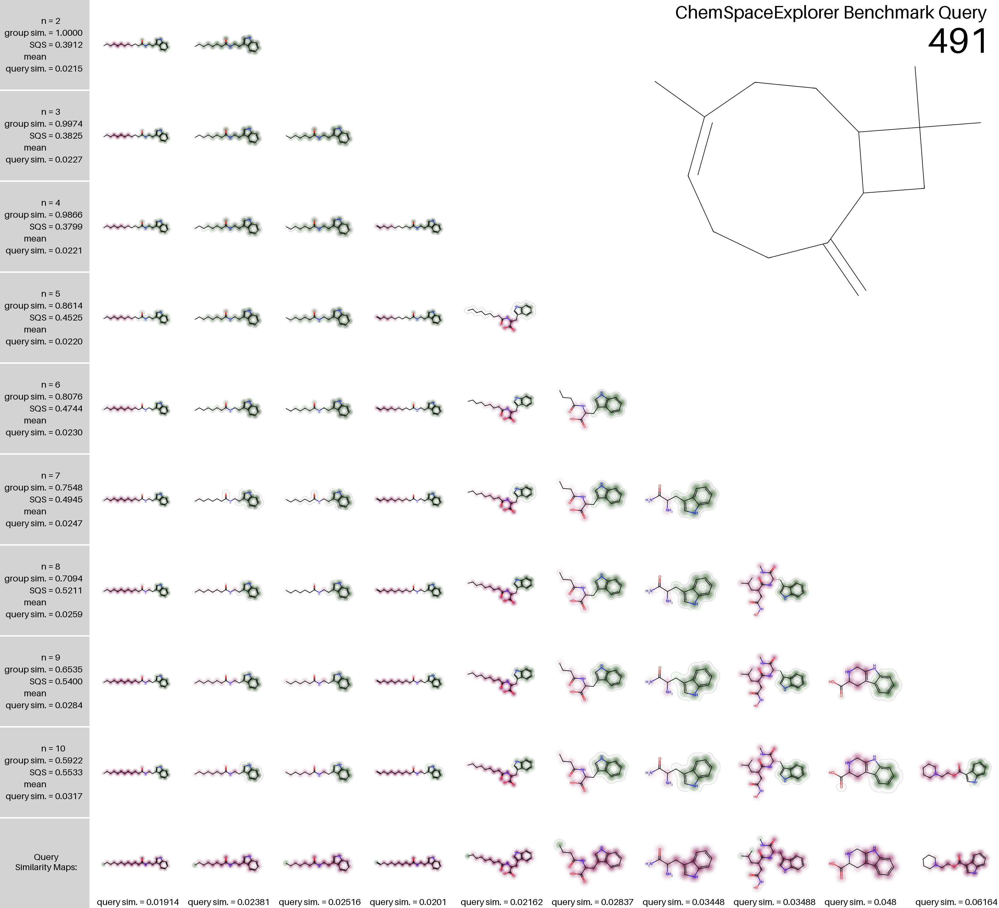

In [365]:
generate_similarity_visualization(491, cse, mol_img_size=mol_img_size)#, overwrite_existing=True)

In [366]:
# hi QS low GS
cse4df["diff"] = abs(cse4df["query_sim"] - cse4df["group_sim"])
mask = (cse4df.query_sim > 0.3) & (cse4df.group_sim < 0.3)
cse4df[cse4df.group_sim < 0.2].sort_values(by="diff", ascending=False).drop(columns=["query_smiles", "group_smiles"]).head(10)

,query_sim,query_mean_weights,group_sim,sgs,sgs_score,isf_score,distance,query_sims,sgs_scores,isf_scores,distances,diff
109,0.304779,0.424089,0.144845,0.319947,0.860944,0.229132,0.201840,"[0.24468085106382978, 0.7090909090909091, 0.17...","[0.9507913527734382, 0.5802297186802345, 0.930...","[0.2536996922584057, 0.24994423552685727, 0.20...","[0.22426704120972774, 0.19731146266483846, 0.1...",0.159934
56,0.299198,0.411994,0.140391,0.300857,0.860743,0.263272,0.235295,"[0.24770642201834864, 0.4105263157894737, 0.46...","[0.9409130133665332, 0.8326125398457965, 0.697...","[0.28475454223206087, 0.2794018465146453, 0.27...","[0.2160136940246179, 0.2869491864137915, 0.165...",0.158807
226,0.039937,0.214290,0.198319,0.312598,0.788095,0.296516,0.113816,"[0.03365384615384615, 0.054187192118226604, 0....","[0.7258884069582179, 0.8565729695740656, 0.760...","[0.30190966066640096, 0.29929411616074836, 0.2...","[0.10074977786702677, 0.1282941982758523, 0.10...",0.158382
2,0.329866,0.378132,0.175190,0.275491,0.870136,0.433773,0.229577,"[0.3183856502242152, 0.6666666666666666, 0.173...","[0.941940391226249, 0.5886642452441444, 0.9777...","[0.4530215089362769, 0.44444766580430367, 0.43...","[0.21729594522723794, 0.2074173104551046, 0.23...",0.154677
197,0.335341,0.381306,0.181400,0.296177,0.879239,0.476121,0.190861,"[0.3183856502242152, 0.6666666666666666, 0.173...","[0.9385635300738835, 0.6247994514550361, 0.985...","[0.5034257379470685, 0.49814912219845636, 0.45...","[0.13723021080825193, 0.1804748285510932, 0.22...",0.153941
187,0.315358,0.427187,0.164293,0.300565,0.845665,0.260962,0.232975,"[0.24770642201834864, 0.4105263157894737, 0.46...","[0.9306803486235047, 0.8059377986168692, 0.680...","[0.2819604415367507, 0.2788282693771374, 0.267...","[0.20763950588311586, 0.2753531162457833, 0.16...",0.151065
95,0.255854,0.352468,0.105387,0.236111,0.830296,0.255408,0.193930,"[0.7116564417177914, 0.1523809523809524, 0.073...","[0.5263877931235708, 0.8766736500370416, 0.959...","[0.2827224084849362, 0.25308746228470663, 0.24...","[0.20470264733865984, 0.1952227198068438, 0.17...",0.150468
3,0.326846,0.378850,0.186280,0.321375,0.930801,0.386724,0.133401,"[0.45222929936305734, 0.4235294117647059, 0.31...","[0.9389501173199446, 0.9325171705042202, 0.878...","[0.4146367560411805, 0.40941776373259503, 0.39...","[0.0632840427404735, 0.14618027498479103, 0.17...",0.140566
57,0.060440,0.241770,0.191200,0.353718,0.804101,0.451075,0.132057,"[0.06962025316455696, 0.05519480519480519, 0.0...","[0.9168010258316506, 0.9353364253119576, 0.679...","[0.4650079468862204, 0.45382342952882004, 0.44...","[0.13754342137752895, 0.1443317427543629, 0.12...",0.130761
106,0.065848,0.227696,0.193004,0.306102,0.890795,0.320415,0.165396,"[0.07291666666666667, 0.07773851590106007, 0.0...","[0.8567255327465937, 0.8883982019065754, 0.911...","[0.35704648257955035, 0.3538462911560155, 0.34...","[0.18363440834811373, 0.1663621195680539, 0.18...",0.127157


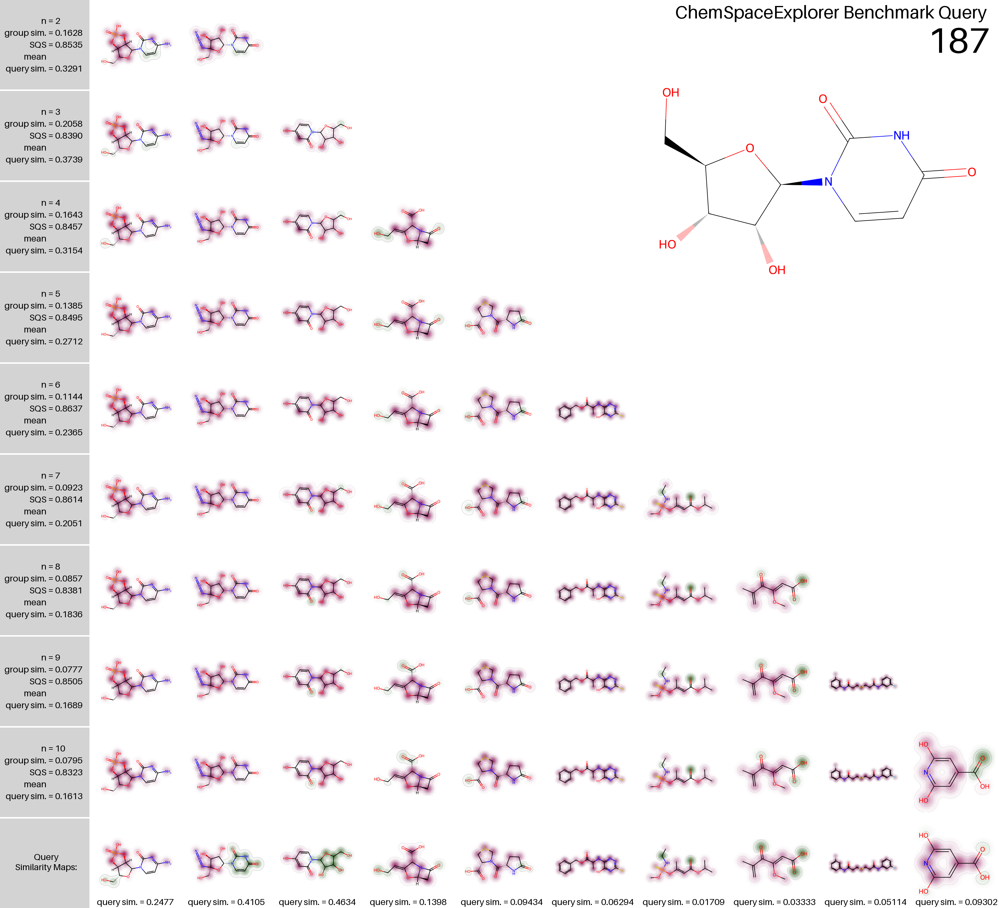

In [367]:
generate_similarity_visualization(187, cse, mol_img_size=mol_img_size)#, overwrite_existing=True)

## get visual xy

In [368]:
import os
from ms_chemical_space_explorer.chemical_space_explorer import start_workflow, spectra_importer


# Get path to the parent directory containing the package
MAIN_FOLDER = os.path.abspath(
    os.path.join(os.getcwd(), "../ms_chemical_space_explorer")
)
DATA_FOLDER = "data"
PROCESSED_DATA_FOLDER = "processed"
FILENAME = "1000_test_spectra.mgf"
FILEPATH = os.path.join(MAIN_FOLDER, DATA_FOLDER, PROCESSED_DATA_FOLDER, FILENAME)
PICKLE = "pickle"

In [369]:
import pickle

def analogue_search(explorer, n: int = 2, epsilon: float = 0.2) -> pd.DataFrame:
    file = os.path.join(PICKLE, f"results_n={n}.pkl")
    try:
        with open(file, "rb") as f:
            analogues = pickle.load(f)
            print(f"Loaded analogues from {file}")

    except FileNotFoundError:
        analogues = explorer.analogue_search(query_spectra, n=n, epsilon=epsilon)

        with open(file, "wb") as f:
            pickle.dump(analogues, f)
        print(f"Analogues saved to {file}")

    return analogues

In [370]:
query_spectra = spectra_importer(FILEPATH)

Processing spectra: 100%|██████████| 1000/1000 [00:04<00:00, 225.33it/s]


In [371]:
explorer = start_workflow(os.path.abspath(os.path.join(MAIN_FOLDER, DATA_FOLDER, PROCESSED_DATA_FOLDER)))

Initialize ChemExplorer


d:\Programmierung\anaconda3\envs\chemspace\Lib\site-packages\ms2deepscore\models\load_model.py:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_settings = torch.load(

In [374]:
n_analogues = analogue_search(explorer=explorer, n=4)
qid = 491
analogues = n_analogues[n_analogues["query_spectrum_id"] == qid]
analogues.smiles == cse4df.iloc[qid].group_smiles

Loaded analogues from pickle\results_n=4.pkl


827    True
826    True
828    True
829    True
Name: smiles, dtype: bool

In [375]:
analogues

,smiles,predicted_distance,mean_distance,std_distance,isf,candidate_mean_similarity,candidate_std_similarity,precursor_mz_diff,visual_x,visual_y,inchikey,query_spectrum_id,ionmode
827,CCCCCCCC(NCCC1=CNC2=C1C=CC=C2)=O,0.166137,0.162399,0.003633,0.723915,0.63296,0.22817,82.016,13.447824,4.395044,VVGFXNYHWJFNJN,491,positive
826,CCCCCCCCCCCC(NCCC1=CNC2=C1C=CC=C2)=O,0.162702,0.162399,0.003633,0.723915,0.63296,0.22817,138.078,7.198332,1.106805,MKNMHNBIWPBTTO,491,positive
828,CCCCCCC(NCCC1=CNC2=C1C=CC=C2)=O,0.159836,0.162399,0.003633,0.723529,0.63296,0.22817,68.000,11.072030,2.946355,KZBBIEIJSXSFOC,491,positive
829,O=C(NCCC1=CNC2=C1C=CC=C2)CCCCCCCCC=C,0.167418,0.162399,0.003633,0.714941,0.63296,0.22817,122.047,13.631817,2.147020,QHLWIEHZTPJZFL,491,positive


In [408]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from rdkit.Chem import MolFromSmiles
from rdkit.Chem import Draw
from ms_chemical_space_explorer.chemical_space_visualizer import draw_mol
from io import BytesIO
from PIL import Image

def draw_chemspace_with_mol_images_positioned(analogues, query_id, query_x=9, query_y=6.5, mol_img_size=300, base_offset=100,
                                              query_position="upper left", analogue_positions=None,
                                              title="",
                                              draw_distance=False, radius_scale=100):
    # Default positions for analogues if not provided
    if analogue_positions is None:
        analogue_positions = ["upper right", "bottom left", "bottom right", "upper left"]
    
    # Create scatter plot of the 4 analogues
    plt.figure(figsize=(12, 10))
    plt.scatter(analogues['visual_x'], analogues['visual_y'], s=100, alpha=0.7, c='blue', label='Analogues')

    # Add query dot
    plt.scatter(query_x, query_y, s=100, alpha=0.7, c='red', marker='s', label='Query')

    # Define colors for each circle
    colors = ['red', 'orange', 'purple', 'brown']

    # Get molecular structures
    query_smiles = cse.iloc[query_id].query_smiles
    query_mol = MolFromSmiles(query_smiles)
    amols = [MolFromSmiles(smile) for smile in analogues.smiles.values]
    
    # Function to generate PIL image from molecule
    def mol_to_pil_image(mol, size=mol_img_size, legend=""):
        draw2d = Draw.MolDraw2DCairo(size, size)
        dopts = draw2d.drawOptions()
        dopts.legendFontSize = int(size / 10)
        draw2d.DrawMolecule(mol, legend=legend)
        #draw2d.FinishDrawing()
        return str_to_image(draw2d.GetDrawingText())
    
    # Function to convert position string to offset coordinates
    def get_offset_from_position(position, base_offset=base_offset):
        position = position.lower().strip()
        
        # Handle different position formats
        if "upper" in position or "top" in position:
            y_offset = base_offset
        elif "lower" in position or "bottom" in position:
            y_offset = -base_offset
        else:
            y_offset = 0
            
        if "left" in position:
            x_offset = -base_offset
        elif "right" in position:
            x_offset = base_offset
        else:
            x_offset = 0
            
        return (x_offset, y_offset)
    
    # Get plot limits
    ax = plt.gca()
    
    # Add circles and molecular structure annotations
    for i, (idx, row) in enumerate(analogues.iterrows()):
        # Circle with predicted_distance in unique color
        if draw_distance:
            circle = patches.Circle((row['visual_x'], row['visual_y']), 
                                radius=(row['predicted_distance'] * radius_scale), 
                                fill=False, 
                                edgecolor=colors[i], 
                                alpha=0.6,
                                linewidth=2,
                                label=f'Analogue {idx} Distance')
            ax.add_patch(circle)
        else:
            # Generate molecular structure image
            mol_img = mol_to_pil_image(amols[i], legend=row['smiles'])
            
            # Get offset for this analogue
            position = analogue_positions[i] if i < len(analogue_positions) else "upper right"
            offset_x, offset_y = get_offset_from_position(position)
            
            # Add molecular structure as annotation
            imagebox = OffsetImage(mol_img, zoom=0.3)
            ab = AnnotationBbox(imagebox, (row['visual_x'], row['visual_y']), 
                            xybox=(offset_x, offset_y), 
                            xycoords='data',
                            boxcoords="offset points",
                            arrowprops=dict(arrowstyle="->", color='black', alpha=0.7))
            ax.add_artist(ab)

    if not draw_distance:
        # Add query molecular structure annotation
        query_mol_img = mol_to_pil_image(query_mol, legend=query_smiles)
        query_imagebox = OffsetImage(query_mol_img, zoom=0.3)
        
        # Get offset for query
        query_offset_x, query_offset_y = get_offset_from_position(query_position)
        
        query_ab = AnnotationBbox(query_imagebox, (query_x, query_y), 
                                xybox=(query_offset_x, query_offset_y), 
                                xycoords='data',
                                boxcoords="offset points",
                                arrowprops=dict(arrowstyle="->", color='black', alpha=0.7))
        ax.add_artist(query_ab)

    plt.xlabel('Visual X')
    plt.ylabel('Visual Y')
    plt.title(title)
    plt.grid(True, alpha=0.3)
    plt.axis('equal')
    plt.legend()
    plt.tight_layout()
    plt.show()

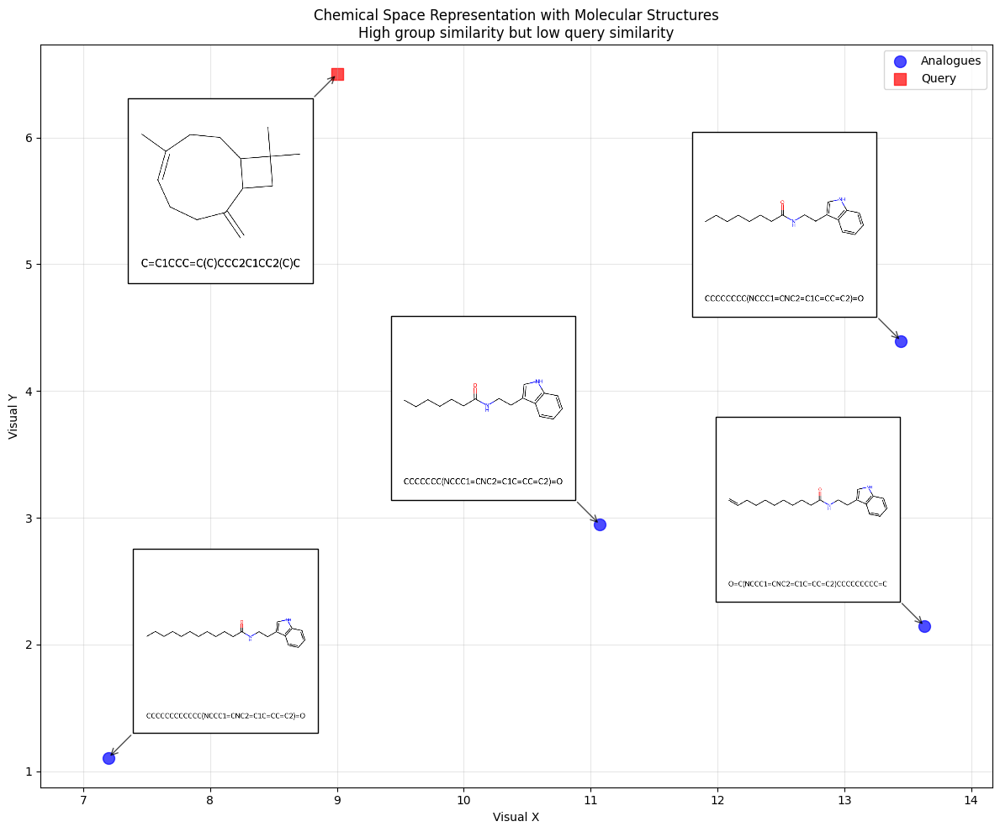

In [409]:
qid = 491
analogues = n_analogues[n_analogues["query_spectrum_id"] == qid]
analogues.smiles.values.tolist() == cse4df.iloc[qid].group_smiles
# Call the function with custom positions
draw_chemspace_with_mol_images_positioned(analogues, 
                                          qid,
                                          mol_img_size=500,
                                          query_position="bottom left",
                                          analogue_positions=["upper left", "upper right", "upper left", "upper left"],
                                          title='Chemical Space Representation with Molecular Structures\nHigh group similarity but low query similarity')

In [411]:
qid = 187
analogues = n_analogues[n_analogues["query_spectrum_id"] == qid]
analogues

,smiles,predicted_distance,mean_distance,std_distance,isf,candidate_mean_similarity,candidate_std_similarity,precursor_mz_diff,visual_x,visual_y,inchikey,query_spectrum_id,ionmode
2016,C1=CN(C(=O)N=C1N)C2[C@H]3[C@@H]([C@H](O2)CO)OP...,0.207640,0.256033,0.036299,0.281960,0.208023,0.282056,60.97201,14.758914,1.168062,NMPZCCZXCOMSDQ,187,negative
2017,[N-]=[N+]=N[C@]1(CO)O[C@@H](n2ccc(=O)[nH]c2=O)...,0.275353,0.256033,0.036299,0.278828,0.208023,0.282056,76.97833,11.726965,1.717001,FHPJZSIIXUQGQE,187,negative
2018,O=c1cc(O)ccn1C1OC(CO)C(O)C1O,0.165731,0.256033,0.036299,0.267830,0.208023,0.282056,-0.99500,14.679260,-0.780403,CBOKZNLSFMZJJA,187,negative
2019,C1[C@@H]2N(C1=O)[C@H](/C(=C/CO)/O2)C(=O)O,0.283176,0.256033,0.036299,0.215230,0.208023,0.282056,-45.02300,3.931897,-1.257115,HZZVJAQRINQKSD,187,negative


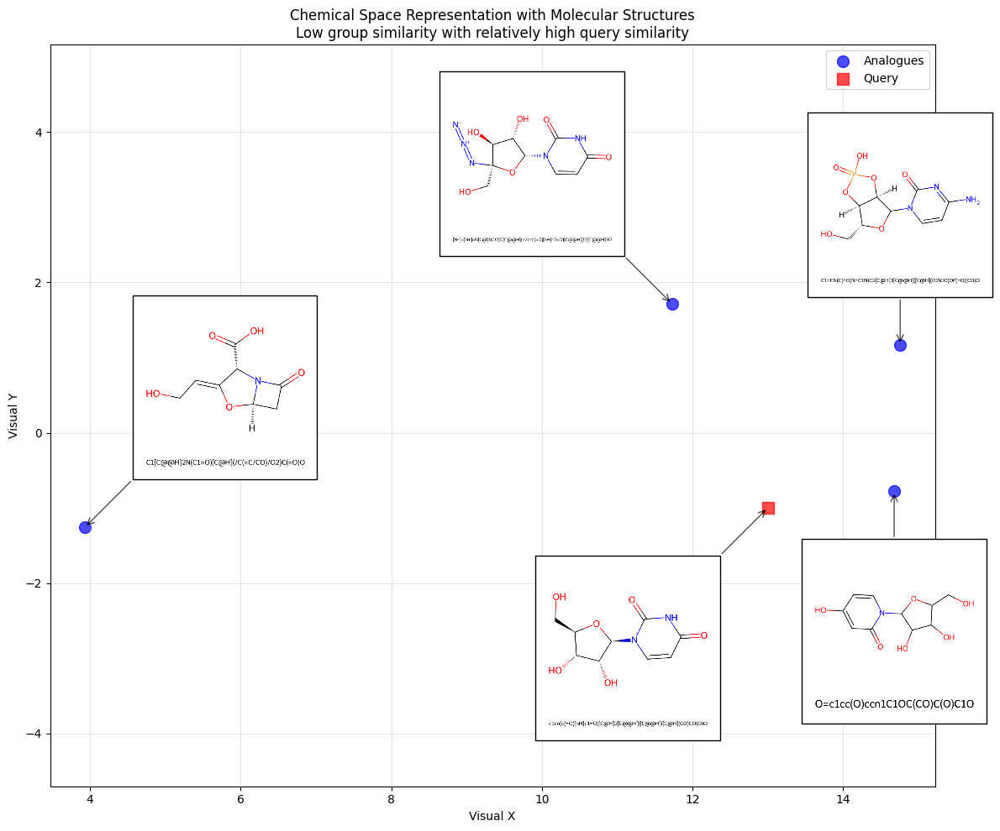

In [412]:
draw_chemspace_with_mol_images_positioned(analogues, 
                                          qid,
                                          mol_img_size=500, base_offset=120,
                                          query_x=13, query_y=-1,
                                          query_position="bottom left",
                                          analogue_positions=["upper", "upper left", "lower", "upper right"],
                                          #draw_distance=True, radius_scale=2,
                                          title='Chemical Space Representation with Molecular Structures\nLow group similarity with relatively high query similarity')

In [413]:
qid = 574
analogues = n_analogues[n_analogues["query_spectrum_id"] == qid]
analogues

,smiles,predicted_distance,mean_distance,std_distance,isf,candidate_mean_similarity,candidate_std_similarity,precursor_mz_diff,visual_x,visual_y,inchikey,query_spectrum_id,ionmode
1154,CCCn1cnc2c1c(=O)n(c(=O)n2C)C,0.139524,0.107925,0.041548,0.675061,0.519728,0.400008,-1.97930,13.650106,-3.594519,HGFWMGARSDHJFP,574,positive
1155,CC(O)Cn1cnc2c1c(=O)n(C)c(=O)n2C,0.072973,0.107925,0.041548,0.669592,0.519728,0.400008,14.01557,9.801714,-2.406199,KYHQZNGJUGFTGR,574,positive
1156,CC(C)Cn1cnc2n(C)c(=O)n(C)c(=O)c12,0.061074,0.107925,0.041548,0.668182,0.519728,0.400008,12.03370,15.929319,2.432955,WHUWQSQEVISUMC,574,positive
1157,Cn1c(=O)c2c(ncn2CC(O)CO)n(C)c1=O,0.049220,0.107925,0.041548,0.656745,0.519728,0.400008,30.01048,15.053963,3.321542,KSCFJBIXMNOVSH,574,positive


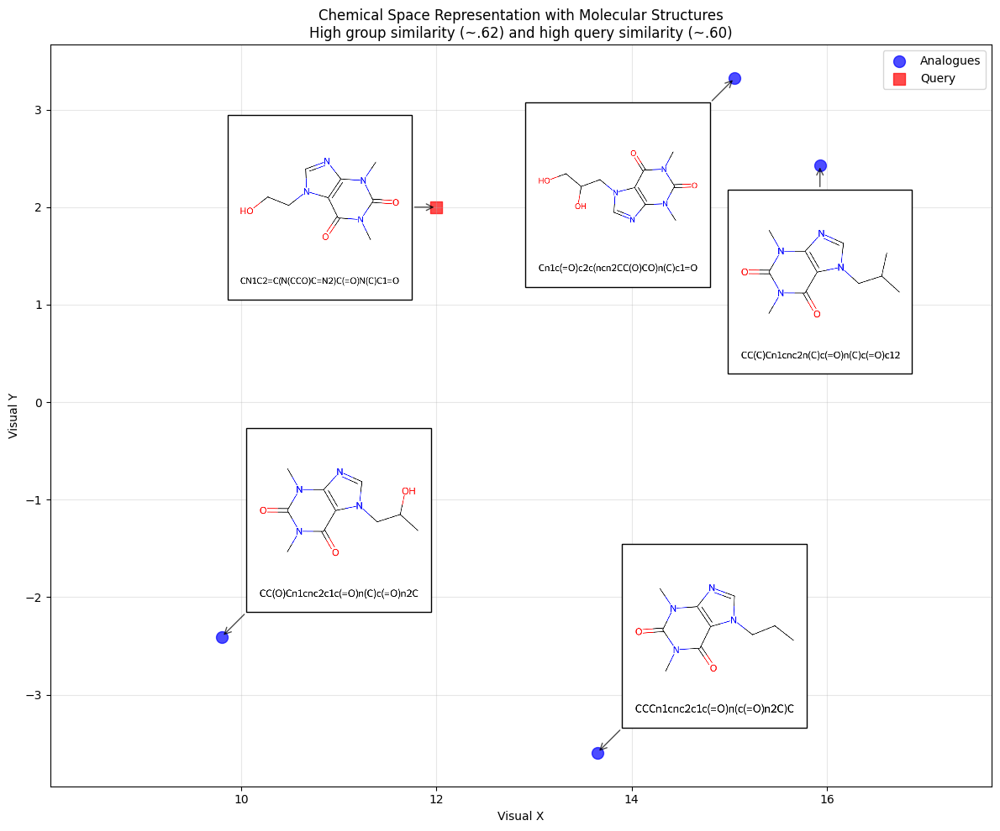

In [431]:
# Call the function with custom positions
draw_chemspace_with_mol_images_positioned(analogues, 
                                          qid,
                                          mol_img_size=500,
                                          query_x=12, query_y=2,
                                          query_position="left",
                                          analogue_positions=["upper right", "upper right", "lower", "lower left"],
                                          #draw_distance=True, radius_scale=20,
                                          title='Chemical Space Representation with Molecular Structures\nHigh group similarity (~.62) and high query similarity (~.60)')